# Project 4: Question Answering on Squad
## CS4740/5740 Fall 2020

### Project Submission Due: Monday, December 21, 11:59pm
Please submit a **pdf file** of this notebook on **Gradescope**, and **ipynb** on **CMS**. For instructions on generating pdf and ipynb files, please refer to the pinned Piazza post @695.



Name: Aliva Das

Netid: ad677


This assignment is to be done **on your own**, i.e., without any teammate.

# Notes

---

1. Please read through the entire notebook before you start coding. That might inform your code structure.
2. Google colab does **not** provide good synchronization; we do not recommend multiple people to work on the same notebook at the same time.




# Overview

---

In this project you will develop NLP models for question-answering tasks. Specifically, you will train models on the SQuAD 2.0 dataset which contains questions on text segments from Wikipedia. The dataset aims to measure the reading comprehension capabilities of machines. Some examples from the main paper are given below. For Project 4, the task is divided into two parts. First, you will decide on a model by yourself and train it on this task. Secondly, you will fine-tune a pretrained model. 




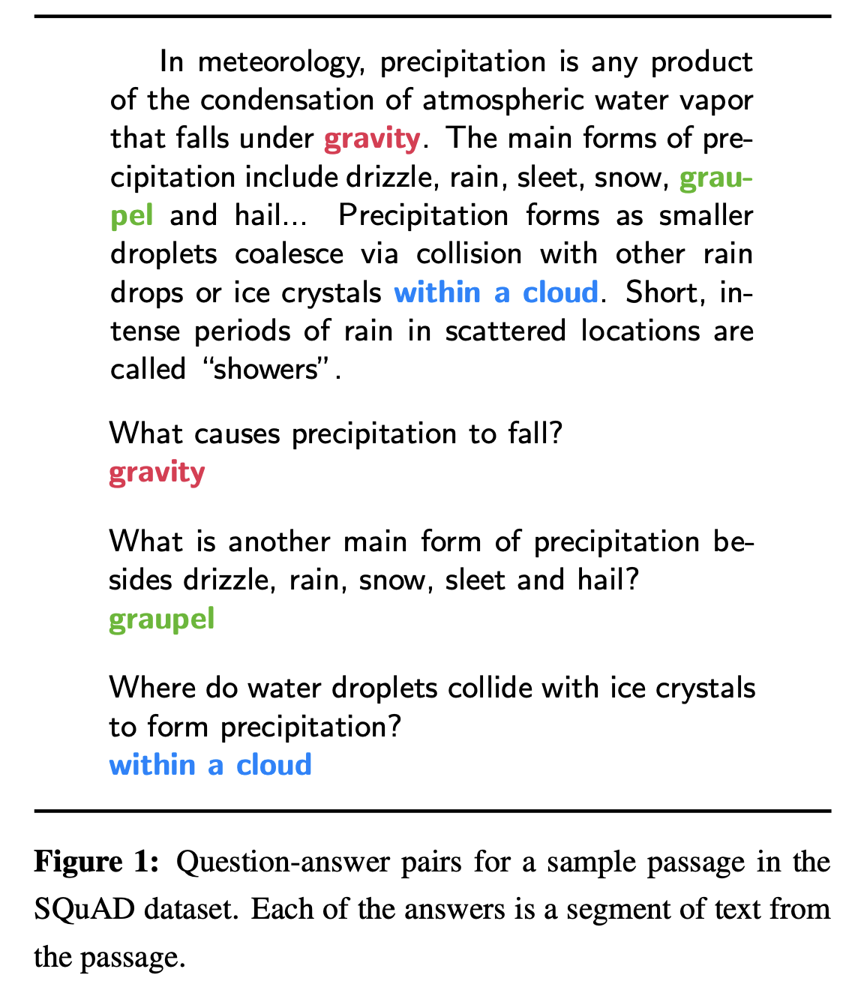

# Task and dataset

---

Obtain the data from [here](https://p4-squad-data.s3.us-east-2.amazonaws.com/train-v2.0.json). You also may consider doing so in a code block below.

```bash
!wget https://p4-squad-data.s3.us-east-2.amazonaws.com/train-v2.0.json
```

This gives you the dataset containing about 130,319 examples. You should split this into a **train** and **validation** dataset as in Project 2.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip3 install transformers

In [ ]:
import collections
import json
import string
import re
import os

import numpy as np
import transformers
import nltk

import random
import time
from tqdm.notebook import tqdm, trange
from typing import Dict, List, Set, Tuple

import torch
import torch.nn as nn
from torch.nn import init
import torch.optim as optim
import torch.nn.utils.rnn as nnur
import torch.nn.utils

from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler

from sklearn import preprocessing

In [ ]:
data_path = os.path.join(os.getcwd(), "drive", "My Drive", "Colab Notebooks", "Project 4", "train-v2.0.json") # replace based on your Google drive organization

In [ ]:
with open(data_path) as json_file: 
    data = json.load(json_file) 

In [ ]:
# Some potentially useful helper functions for the metrics
def remove_articles(text):
    regex = re.compile(r'\b(a|an|the)\b', re.UNICODE)
    return re.sub(regex, ' ', text)

def white_space_fix(text):
    return ' '.join(text.split())

def remove_punc(text):
    exclude = set(string.punctuation)
    return ''.join(ch for ch in text if ch not in exclude)

def lower(text):
    return text.lower()

def normalize_answer(s):
    """Lower text and remove punctuation, articles and extra whitespace."""
    return white_space_fix(remove_articles(remove_punc(lower(s))))

def get_tokens(s):
    if not s:
        return []
    return normalize_answer(s).split()

In [ ]:
passages = []
neg_art = 0
for art in data["data"]:
  counted = False
  for passage in art["paragraphs"]:
      passages.append(passage)
      for qas in passage['qas']:
        if qas['is_impossible'] and counted == False:
          neg_art += 1
          counted = True

In [ ]:
contexts = []
questions = []
answers = []
negatives = []

for p in passages:
  contexts.append(get_tokens(p['context']))
  for qas in p['qas']:
    questions.append(get_tokens(qas['question']))
    if qas['is_impossible']:
      negatives.append(qas['question'])
    for a in qas['answers']:
      answers.append(get_tokens(a['text']))


### Q1: Initial data observations
What are your initial observations after you explore the dataset?

**Answer:**

***Quatitative Analysis***

No. of articles in dataset : 442

No. of articles with unanswerable questions : 285

Total no. of questions : 130319

Total no. of non-answerable questions : 43498

Total no. of answerable questions : 86821

Percentage of non-answerable questions : 33.37809528925176%

Percentage of answerable questions : 66.62190471074824%

Maximum token length of context paragraphs in the dataset : 581

Maximum token length of questions in the dataset : 34

Maximum token length of answers in the dataset : 35

***Qualitative Analysis***

Some types of non-answerable questions in the dataset are described below:

1. Entity Swap

    Context: ...Congress, however, managed to override fifteen of Johnson's 
    twenty-nine vetoes. ...

    Question: How many of Johnson's fifteen vetoes did Congress 
    override?

    Here, the numbers fifteen and twenty-nine are swapped. As Johnson actually
    had twenty-nine vetoes instead of fifteen, this question is not answerable.

2. Negation
 
    Context: According to a study done by Helmut Fend (who had always been a   
    fierce proponent of comprehensive schools) revealed that comprehensive 
    schools do not help working class students. He compared alumni of the 
    tripartite system to alumni of comprehensive schools. While working class 
    alumni of comprehensive schools were awarded better school diplomas at age 
    35, they held similar occupational positions as working class alumni of the 
    tripartite system and were as unlikely to graduate from college.

    Question: To which system didn't Fend compare comprehensive school alumni?

    Here, the question takes an entailment from the context and negates it. As 
    the question in no longer consistent with what the context paragraph tells 
    the reader, it is not answerable.

3. Antonym

    Context: ... However, United Nations Members disagreed and approved UNFPA’s 
    new country programme in January 2006. ...

    Question: In January 2006, who destroyed UNFPA's new country programme?

    Here, the question contains a phrase that makes it directly in opposition 
    with what is given in the context paragraph, as 'destroyed' is semantically 
    opposite to 'approved'. 


4. Out of Context

    Context: ... The first bacterial genome to be sequenced was that of 
    Haemophilus influenzae, completed by a team at The Institute for Genomic 
    Research in 1995. ... The first genome sequence for an archaeon, 
    Methanococcus jannaschii, was completed in 1996, again by The Institute for 
    Genomic Research.

    Question: When was The Institute for Genome Research founded?

    In this case, the context paragraph does not tell us any information about 
    when the Institute for Genome Research was founded. Thus the question 
    covers a topic that is out of context.


In [ ]:
max_lengths_contexts = max([len(l) for l in contexts])
max_lengths_questions = max([len(l) for l in questions])
max_lengths_answers = max([len(l) for l in answers])

In [ ]:
print("No. of articles in dataset : " + str(len(data["data"])))
print("No. of articles with unanswerable questions : " + str(neg_art))
print("Total no. of questions : " + str(len(questions)))
print("Total no. of non-answerable questions : " + str(len(negatives)))
print("Total no. of answerable questions : " + str(len(questions) - len(negatives)))
print("Percentage of non-answerable questions : " + str(len(negatives)*100/len(questions)) +"%")
print("Percentage of answerable questions : " + str(100 - (len(negatives)*100/len(questions))) +"%")
print("Maximum token length of context paragraphs in the dataset : " + str(max_lengths_contexts))
print("Maximum token length of questions in the dataset : " + str(max_lengths_questions))
print("Maximum token length of answers in the dataset : " + str(max_lengths_answers))

The two metrics we will be using are **exact match** and **F1**. The exact match metric measures the percentage of predictions that match any one of the ground truth answers **exactly**. The F1 score is a looser metric, which measures the average overlap between the prediction and ground truth answer.

The F1 metric on answers is defined as:

$$F_1 = 2 \cdot \frac{Precision \cdot Recall}{Precision + Recall}$$

where $Precision$ is:
$$Precision = \frac{TP}{TP + FP} = \frac{\text{# of matching tokens}}{\text{# of predicted tokens}}$$

and $Recall$ is:
$$Recall = \frac{TP}{TP + FN} = \frac{\text{# of matching tokens}}{\text{# of gold tokens}}$$

and $TP$ refers to the number of true positives; $FP$ is the number of false positives; and $FN$ is the number of false negatives. (See Jurafsky & Martin Ch. 4.7).

These are then also averaged with the "has answer" prediction where we replace the individual question-answer pair score with a 1 if it correctly predicts that the question is not answerable, and keep the original score otherwise.

### Q1.1: The metrics

How much time does it take to compute these metrics? When will these metrics correlate well/poorly with human judgement of answer quality? Please implement the metric yourself.


For this project, I implemented the Exact Match (EM) and F1 metrics which give the required score for both answerable and non-answerable questions. I report these metrics separately for examples that have answers and do not have answers
during validation. 

As the EM metric is a simple equality check and in Python, this operation
is assumed to be O(1), this metric can be evaluated in constant time. However,
the F1 metric has to loop through each token in the predicted answer and check if it is present in the gold answer. Thus, this metric has time complexity 
O($n^2$).

The EM metric should correlate really well with the human judgement of answer quality as the predicted answer is exactly what is expected in the standard. However, as it is possible that the model could come up with an answer that is not an exact match for the gold answers as annotated in the test set, but could be considered to be a good quality answer for a human, this metric may not be the best at evaluating the learning capability of the model.

The F1 metric does resolve the above issue with the EM metric, but often it can correlate poorly with the human judgement of answer quality. This is because this metric treats the predicted and gold answers as a bag of tokens, thus despite of the order in which these tokens appear in the predicted answer, they will all receive the same score. However, the order of tokens in the answer greatly influences its quality in coherence and interpretability. For example, ["Mirabelle", "barks", "at", "the", "postman"] has the same f1 score as ["postman", "barks", "Mirabelle", "the", "at"], but a human would judge the first answer as being more coherent and understandable than the latter. 

In [ ]:
# Another batch of helper functions, feel free to modify as needed
def apply_no_ans_threshold(scores, na_probs, qid_to_has_ans):
    """apply_no_ans_threshold applies the no-answer threshold (or mapping) to
    the no-ans probabilities/predictions.

    :param scores: A mapping of qid to the f1 or em score
    :type scores: dict[qid: str, score: float]
    :param na_probs: A mapping of qid to the no answer prediction/probability
    :type na_probs: dict[qid: str, score: float]
    :qid_to_has_ans: A mapping of qid to answerability
    :type qid_to_has_ans: dict[qid: str, answerability: bool]
    :returns: A mapping of qid to new scores accounting for answerability
    :rtype: dict[qid: str, score: float]
    """
    new_scores = {}
    return new_scores

def make_eval_dict(exact_scores, f1_scores, qid_list=None):
    """make_eval_dict makes a dictionary from the individual scores of qa pairs.
    
    :param exact_scores: Mapping of qid to the em score
    :type exact_scores: dict[qid: str, score: float]
    :param f1_scores: Mapping of qid to f1 score
    :type f1_scores: dict[qid: str, score: float]
    :param qid_list: List of qid's to aggregate, used to separate HasAns and
        NoAns scores for better analysis of models
    :type qid_list: List[qid: str]
    :returns: mapping of relevant evaluation metrics to their scores
    :rtype: OrderedDict[value: str, score: float]
    """
    return collections.OrderedDict([
        ("exact", 0.),
        ("f1", 0.),
        ("total", 0.),
    ])

def merge_eval(main_eval, new_eval, prefix):
    """merge_eval is a helper to merge two outputs of make_eval_dict.

    This is useful for cases when we want to have the aggregate scores, but also
    want to look at the scores for HasAns and for NoAns. Using make_eval_dict,
    we can take only those that have an answer, compute and merge with the
    original eval_dict.

    :param main_eval: The main evaluation dictionary that you report from
    :type main_eval: dict[value: str, score: float]
    :param new_eval: The new evaluation dictionary that you want to merge in
    :type new_eval: dict[value: str, score: float]
    :param prefix: The prefix you want attached to the new_eval scores.
        For example, HasAns as a prefix can be used to get HasAns_f1.
    :type prefix: str
    :returns: combination of main_eval and new_eval with prefix on new_eval keys
    :rtype: OrderedDict[value: str, score: float]
    """
    for k in new_eval:
        main_eval['%s_%s' % (prefix, k)] = new_eval[k]

In [ ]:
# metric implementation here
def compute_exact(a_gold, a_pred):
    """
    This function calculates the exact match score given two 
    lists of tokens a_gold and a_pred. The exact match score 
    is 1 if a_gold and a_pred are equal and zero otherwise.
    :param a_gold: The gold answer for a context-question pair
    :type a_gold: List[str]
    :param a_pred: The predicted answer for a context-question pair
    :type a_pred: List[str]
    """
    if a_gold == a_pred:
      return 1
    else:
      return 0

def compute_f1(a_gold, a_pred):
    """
    This function calculates the f1 score given two 
    lists of tokens a_gold and a_pred. It is calculated as
    f1 = (2*p*r)/(p+r) where p is the precision and r is the 
    recall score. These values are calculated as follows:
    p = # of matching tokens / # of tokens in a_pred
    r = # of matching tokens / # of tokens in a_gold. 
    If a_gold is an empty list, this function returns 1 only
    if a_pred is empty, otherwise it returns 0.
    :param a_gold: The gold answer for a context-question pair
    :type a_gold: List[str]
    :param a_pred: The predicted answer for a context-question pair
    :type a_pred: List[str]
    """
    match = []
    if len(a_pred) == 0 and len(a_gold) == 0:
      return 1
    elif len(a_pred) == 0 and len(a_gold) != 0:
      return 0
    elif len(a_pred) != 0 and len(a_gold) == 0:
      return 0
    else:
      for a in a_pred:
        if a in a_gold:
          match.append(a)
      if len(match) == 0:
        return 0
      p = len(match)/len(a_pred)
      r = len(match)/len(a_gold)
      return (2*p*r)/(p+r)


# Model 1: Pick your own model

---

In this part of the project you will implement a model to perform well on the SQuAD dataset. The features that you use are entirely up to you. As always, a good strategy is to work through lots of examples from the training data to determine what types of features would be most useful. You are **NOT** allowed to use (i) deep contextualized pre-trained language models (e.g. ELMo, GPT, BERT) since they will be covered in Part B, or (ii) any existing code written for the SQUAD task. Otherwise, feel free to re-use any code you have written for previous projects in the class as well as **general** ML/NLP tools (e.g., PyTorch, spaCy). Please use the code block below to code, prototype, and test your language model:

Code of Academic Integrity:  We encourage collaboration regarding ideas, etc. However, please **do not copy code from online or share code with other students**. We will be running programs to detect plagiarism.

In [ ]:
import gensim.downloader as api

glove = api.load("glove-wiki-gigaword-50") # GloVe Vectors

In [ ]:
def ans_start_end(para, ans):
    """
    This function returns the starting and ending indexes of the tokenized answer
    in the tokenized context. If the list of answer tokens is empty 
    or is not present (in order) in the list of context tokens, this function 
    returns the start index as 1 and the end index as 0.
    :param para: List of context tokens
    :type para: List[str]
    :param ans: List of answer tokens
    :type ans: List[str]
    """
    if len(ans) == 0:
      return 1, 0
    start = -1
    for p in range(len(para)):
      a = 0
      k = p
      start = k
      while a < len(ans) and k < len(para) and para[k] == ans[a]:
        a += 1
        k += 1
      if a == len(ans):
        return start, start + len(ans) - 1
      else:
        continue
    return 1, 0

In [ ]:
squad = []
for p in passages:
  context = get_tokens(p['context'])
  for qas in p['qas']:
    question = get_tokens(qas['question'])
    qid = qas['id']
    if qas['answers'] == []:
      answer = []
    for a in qas['answers']:
      answer = get_tokens(a['text'])
    squad.append((context, qid, question, answer)+ans_start_end(context,answer))

In [ ]:
squad = np.array(squad) # Converting to numpy array for easy indexing

In [ ]:
# this is the vector representation for words in the Emotion dataset not present
# GloVe vocabulary

unk = 0
for item in glove.wv.vocab:
    unk += glove[item]

unk /= len(glove.wv.vocab)

In [ ]:
def glove_vec(input_seq, glove, unk):
    """
    glove_vec converts the input sequence into a tensor containing a list of
    GloVe vectors, one for each token in the sequence.
    :param input_seq: the input sequence
    :type input_seq: List[String]
    :param glove: the GloVe word to vector mapping
    :type glove: gensim.models.keyedvectors.Word2VecKeyedVectors
    :param unk: the vector representation used for a word in the input sentence
                 not present in GloVe mapping
    :type unk: List[Float]
    :rtype: torch.Tensor[List[List[Float]]]
    """
    vecs = []
    for x in input_seq:
      try:
        vec = glove[x]
      except:
        vec = unk
      vecs.append(vec)
    return torch.tensor(vecs)

In [ ]:
from nltk import pos_tag

nltk.download('averaged_perceptron_tagger')

words = ['$', "''", '(', ')', ',', '--', '.', ':', 'CC', 'CD', 'DT', 'EX', 'FW', 'IN', 'JJ',
 'JJR', 'JJS', 'LS', 'MD', 'NN', 'NNP', 'NNPS', 'NNS', 'PDT', 'POS', 'PRP', 'PRP$', 'RB', 'RBR',
 'RBS', 'RP', 'SYM', 'TO', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ', 'WDT', 'WP',
 'WP$', 'WRB', '``']
        
le = preprocessing.LabelEncoder()  # Categorizing POS tags from strings to integers
targets = le.fit_transform(words)

def paragraph_features(para, q, glove, unk):
    """
    This function returns the paragraph representation for the context in addition
    to the sequence of glove vectors that make up the context.
    The paragraph representation includes concatenating the glove vector, POS tag and lower cased
    exact match indicator values for each token in the paragraph.
    :param para: The tokenized context paragraph
    :type para: List[String]
    :q: The tokenized question
    :type q: List[String]
    :param glove: the GloVe word to vector mapping
    :type glove: gensim.models.keyedvectors.Word2VecKeyedVectors
    :param unk: the vector representation used for a word in the input sentence
    :not present in GloVe mapping
    :type unk: List[Float]
    """
    f_lst = pos_tag(para)
    pos = le.transform([f[1] for f in f_lst])
    em = [1 if p in q else 0 for p in para]

    vecs = []
    gs = []
    for x in range(len(para)):
      try:
        vec = glove[para[x]]
      except:
        vec = unk
      gs.append(vec)
      vec = np.append(vec, [pos[x],em[x]])
      vecs.append(vec)
    return torch.tensor(vecs), torch.tensor(gs)

In [ ]:
class SQUAD(Dataset):
    """
    SQUAD is a torch dataset to interact with the SQUAD 2.0 dataset.

    :param data: The vectorized dataset
    :type data: List
    """
    def __init__(self, data):
        self.X = data
        self.len = len(data)
    
    def __len__(self):
        """__len__ returns the number of samples in the dataset.

        :returns: number of samples in dataset
        :rtype: int
        """
        return self.len
    
    def __getitem__(self, index):
        """__getitem__ returns the sample data for a given index

        :param index: index within dataset to return
        :type index: int
        """
        return self.X[index]

def get_data_loaders_rnn(train, val, batch_size=16):
    """
    get_data_loaders_rnn generates data loaders from the training and validation sets.
    :param train: the training data set (both input and corresponding output)
    :type train: List
    :param val: the validation data set
    :type val: List
    :param batch_size: the number of samples in a batch (default 16)
    :type batch_size: int
    """
    # First we create the dataset given our train and validation lists
    dataset = SQUAD(train + val)

    # Then, we create a list of indices for all samples in the dataset
    train_indices = [i for i in range(len(train))]
    val_indices = [i for i in range(len(train), len(train) + len(val))]

    # Now we define samplers and loaders for train and val
    train_sampler = SubsetRandomSampler(train_indices)
    train_loader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler)
    
    val_sampler = SubsetRandomSampler(val_indices)
    val_loader = DataLoader(dataset, batch_size=batch_size, sampler=val_sampler)

    return train_loader, val_loader

In [ ]:
train = list(range(len(squad[:104255])))
val = list(range(len(squad[104255:])))

# Simple approximate 80:20 training validation split

train_loader, val_loader = get_data_loaders_rnn(train, val, batch_size=10)

In [ ]:
def padding_seqs(data):
    """
    padding_seqs returns the padded vectorized paragraph features, padded 
    glove sequence represention of the context, original context length, question id, 
    padded glove sequence represention of the question, orginal question length,
    the tokenized answer and the start and end token indexes for the answer
    in the context.
    :param data: The dataset, where each sample consists of a tuple 
                 with the tokenized context, question id, tokenized question,
                 tokenized answer and start and end token indexes of the answer
                 in the context
    :type data: List[Tuple[List[str], str, List[str], List[str], int, int]]
    :rtype: Tuple[torch.Tensor[List[List[List[Float]]]], 
            torch.Tensor[List[List[List[Float]]]], 
            torch.Tensor[List[int]], List[str],
            torch.Tensor[List[List[List[Float]]]],
            torch.Tensor[List[int]], List[List[str]], 
            torch.Tensor[List[int]], torch.Tensor[List[int]]]
    """
    seq_lengths = []
    seqs = []
    labels = []
    (conts, qids, ques, ans, start, end) = zip(*data)
    p_new = []
    glove_seq = []
    for i in range(len(conts)):
        s = paragraph_features(conts[i], ques[i], glove, unk)
        p_new.append(s[0])
        glove_seq.append(s[1])
    ques_vec = [glove_vec(q, glove, unk) for q in ques]
    seq_lengths = torch.tensor([len(c) for c in conts])
    padded = nnur.pad_sequence(p_new, batch_first=True, padding_value=0)
    padded_g = nnur.pad_sequence(glove_seq, batch_first=True, padding_value=0)
    p_quests = nnur.pad_sequence(ques_vec, batch_first=True, padding_value=0)
    q_lengths = torch.tensor([len(q) for q in ques])
    start = torch.tensor([s for s in start])
    end = torch.tensor([e for e in end])
    return padded, padded_g, seq_lengths, qids, p_quests, q_lengths, ans, start, end

In [ ]:
class QA(nn.Module):
  """
  This class represents the DrQA model.
  """

  def __init__(self, in_dim_p, in_dim_q, h, n_layers): 
    """
    This function initializes the DrQA model.
    :param in_dim_p: the number of features for the input for
                    the paragraph LSTM
    :type in_dim_p: int
    :param in_dim_q: the number of features for the input for
                    the question LSTM
    :type in_dim_q: int
    :param h: the number of features in each of the model's hidden states
    :type h: int
    :param n_layers: the number of stacked LSTM layers for the question
                    and paragraph LSTMs. 
    :type n_layers: int
    """
    super(QA, self).__init__()

    self.in_dim_q = in_dim_q
    self.in_dim_p = in_dim_p
    self.h = h 
    self.n_layers = n_layers

    self.act = nn.ReLU()
    self.attn = nn.Linear(in_dim_q,in_dim_q)

    self.q_lstm = nn.LSTM(input_size=in_dim_q,
                        hidden_size=h,
                        num_layers=n_layers, 
                        bidirectional=True)

    torch.nn.init.xavier_normal_(self.q_lstm.weight_ih_l0)
    torch.nn.init.xavier_normal_(self.q_lstm.weight_hh_l0)

    self.p_lstm = nn.LSTM(input_size=in_dim_q+in_dim_p,
                        hidden_size=h,
                        num_layers=n_layers, 
                        bidirectional=True)

    torch.nn.init.xavier_normal_(self.p_lstm.weight_ih_l0)
    torch.nn.init.xavier_normal_(self.p_lstm.weight_hh_l0)

    self.linear_start = nn.Linear(2*h,2*h)
    self.linear_end = nn.Linear(2*h,2*h)

    self.softmax = nn.LogSoftmax(dim=1)
    self.softmax_attn = nn.Softmax(dim=2)
    self.loss = nn.NLLLoss()

  def compute_Loss(self, pred_start, gold_start, pred_end, gold_end):
    """
    This function computes the loss between the correct outputs and the predicted outputs
    using the model's loss function.
    param pred_start: The predicted starting token probabilities over sequence lengths
                      from the model for some samples. pred_start should be of size 
                      Batch Size * Sequence Length.
    type pred_start: torch.Tensor[List[List[Float]]]
    param gold_start: The correct outputs for the corresponding samples
                      The correct outputs should be of size Batch Size 
    type gold_start: torch.Tensor[List[int]]]
    param pred_end: The predicted ending token probabilities over sequence lengths
                      from the model for some samples. pred_end should be of size 
                      Batch Size * Sequence Length.
    type pred_end: torch.Tensor[List[List[Float]]]
    param gold_end: The correct outputs for the corresponding samples
                      The correct outputs should be of size Batch Size 
    type gold_end: torch.Tensor[List[int]]]
    """
    return self.loss(pred_start, gold_start) + self.loss(pred_end, gold_end)

  def forward(self, in_paras, glo_paras, len_paras, in_qs, len_qs):
    """
    This function performs the forward pass for the DrQA model and returns the 
    start and end log probabilities for each token in the input paragraph.
    The output is of size Batch Size * Number of classes.
    :param in_paras: The vectorized padded input paragraphs with additional
                  features for the paragraph LSTM
    :type in_paras: torch.Tensor[List[List[List[Float]]]]
    :param glo_paras: The vectorized GloVe representation padded input paragraphs
    :type glo_paras: torch.Tensor[List[List[List[Float]]]]
    :param len_paras: The original lengths for the corresponding input paragraphs
    :type len_paras: torch.Tensor[List[int]]
    :param in_qs: The vectorized GloVe representation padded input questions
    :type in_qs: torch.Tensor[List[List[List[Float]]]]
    :param len_qs: The original lengths for the corresponding input questions
    :type len_qs: torch.Tensor[List[int]]
    :rtype: Tuple[torch.Tensor[List[List[Float]]],torch.Tensor[List[List[Float]]]]
    """
    con_proj = self.act(self.attn(glo_paras.to(get_device())))
    q_proj = torch.transpose(self.act(self.attn(in_qs.to(get_device()))), 1, 2)

    at = torch.matmul(con_proj, q_proj)
    mask = (torch.arange(max(len_qs))[None, None, :]).to(get_device()) < len_qs[:, None, None]
    mask = mask.repeat(1, max(len_paras), 1)
    at = at.masked_fill(mask==0, -np.inf)
   
    align_q = torch.matmul(self.softmax_attn(at), in_qs)
    para_f = torch.cat((align_q,in_paras),2)

    packed_q = nnur.pack_padded_sequence(in_qs.to("cpu"), len_qs.to("cpu"), batch_first=True, 
                                            enforce_sorted=False).to("cpu")
    output_q, _ = self.q_lstm(packed_q.to(get_device()))
    unpacked_out_q, q_lengths = nnur.pad_packed_sequence(output_q, batch_first=True)

    q = torch.mean(unpacked_out_q, 1)

    packed_para = nnur.pack_padded_sequence(para_f.to("cpu"), len_paras.to("cpu"), batch_first=True, 
                                            enforce_sorted=False).to("cpu")
    output_p, _ = self.p_lstm(packed_para.to(get_device()).float())
    unpacked_out_p, p_lengths = nnur.pad_packed_sequence(output_p, batch_first=True)

    w_s = self.linear_start(q).unsqueeze(1)
    start_mult = torch.matmul(unpacked_out_p, torch.transpose(w_s, 1,2))
    start_ps = torch.exp(start_mult)
    mask_c = torch.arange(max(len_paras))[None, :, None].to(get_device()) < len_paras[:, None, None]
    start_ps = start_ps.masked_fill(mask_c==0, -np.inf)

    w_e = self.linear_end(q).unsqueeze(1)
    end_mult = torch.matmul(unpacked_out_p, torch.transpose(w_e, 1,2))
    end_ps = torch.exp(end_mult)
    end_ps = end_ps.masked_fill(mask_c==0, -np.inf)

    start_vector = self.softmax(start_ps).squeeze(2) # remember to include the predicted unnormalized scores which should be normalized into a (log) probability distribution

    end_vector = self.softmax(end_ps).squeeze(2) # remember to include the predicted unnormalized scores which should be normalized into a (log) probability distribution

    return start_vector, end_vector

  def load_model(self, save_path):
    self.load_state_dict(torch.load(save_path))

  def save_model(self, save_path):
    torch.save(self.state_dict(), save_path)

In [ ]:
def train_epoch_rnn(model, train_loader, optimizer):
  """
  This function trains the model for one epoch.
  param model: the model that we are training
  param train_loader: a data loader that contains training samples to train our model
  param optimizer: the optimizer used to train our model        
  """
  model.train()
  total = 0
  loss = 0

  for t in tqdm(train_loader, leave=False, desc="Training Batches"):
    batch = squad[t]
    pad_p, glo_p, pl, qids, pad_q, ql, ans, start, end = padding_seqs(batch)

    output = model(pad_p.to(get_device()), glo_p.to(get_device()), pl.to(get_device()),
                  pad_q.to(get_device()), ql.to(get_device()))
    
    total += output[0].size()[0]
    _, start_pred = torch.max(output[0], 1)
    _, end_pred = torch.max(output[1], 1)

    loss = model.compute_Loss(output[0], start.to(get_device()), output[1], end.to(get_device()))
    optimizer.zero_grad()
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1)

    optimizer.step()
  print("train loss: " + str(loss))
  return

def evaluation_rnn(model, val_loader, optimizer):
  model.eval()
  loss = 0
  f1_ans = 0
  f1_noans = 0
  em_ans = 0
  em_noans = 0
  total = 0
  count_noans = 0

  for t in tqdm(val_loader, leave=False, desc="Validation Batches"):
    batch = squad[t]
    pad_p, glo_p, pl, qids, pad_q, ql, ans, start, end = padding_seqs(batch)
    output = model(pad_p.to(get_device()), glo_p.to(get_device()), pl.to(get_device()),
                  pad_q.to(get_device()), ql.to(get_device()))
    total += output[0].size()[0]
    _, start_pred = torch.max(output[0], 1)
    _, end_pred = torch.max(output[1], 1)
    conts = batch[np.arange(len(batch)),0]
    for i in range(len(conts)):
      ans_pred = conts[i][start_pred[i]:end_pred[i]+1]
      ans_gold = ans[i]
      if ans_gold == []:
        val_f1 = compute_f1(ans_gold, ans_pred)
        val_em = compute_exact(ans_gold, ans_pred)
        f1_noans += val_f1
        em_noans += val_em
        count_noans += 1
      else:
        val_f1 = compute_f1(ans_gold, ans_pred)
        val_em = compute_exact(ans_gold, ans_pred)
        f1_ans += val_f1
        em_ans += val_em

    l = model.compute_Loss(output[0], start.to(get_device()), output[1], end.to(get_device()))
    loss += l.detach().item()

  loss /= len(val_loader)
  print("val loss: " + str(loss))
  print("val f1 HasAns: " + str(f1_ans/(total-count_noans)))
  print("val em HasAns: " + str(em_ans/(total-count_noans)))
  if count_noans == 0:
    print("No questions with no answers")
  else:
    print("val f1 NoAns: " + str(f1_noans/count_noans))
    print("val em NoAns: " + str(em_noans/count_noans))
  
  # Print validation metrics
  return

def train_and_evaluate_rnn(number_of_epochs, model, train_loader, val_loader):
  optimizer = optim.Adamax(model.parameters())
  for epoch in trange(number_of_epochs, desc="Epochs"):
    train_epoch_rnn(model, train_loader, optimizer)
    evaluation_rnn(model, val_loader, optimizer)
  return optimizer

In [ ]:
# Lambda to switch to GPU if available
get_device = lambda : "cuda:0" if torch.cuda.is_available() else "cpu"

In [ ]:
torch.autograd.set_detect_anomaly(True)
h = 512
model = QA(52, 50, h, 1).to(get_device())
opt = train_and_evaluate_rnn(2, model, train_loader, val_loader)

In [ ]:
# model_path = os.path.join(os.getcwd(), "drive", "My Drive", "Colab Notebooks", "Project 4")
# model.save_model(model_path+'/modeldrqa1'+str(epoch)+'.pt')
# torch.save(optimizer.state_dict(), model_path+'/optdrqa1'+str(epoch)+'.pt')



### Q2 : Explain your  implementation

Q2.1: Explain here your implementation (e.g. **which algorithms/data structures** you used). Make clear which parts were implemented from scratch vs. obtained via an existing package. 

**Answer:**

**Preprocessing Data**

I preprocessed the SQuAD dataset so as to create a dataset stored as a numpy array where every example had a tokenized context, question id, tokenized question, tokenized answer as well as the start and end token indexes of the answer in the context. The tokenizing functions that remove articles, punctuations, whitespace and lower string text were provided in the released template of this notebook, while I implemented the function that gives the start and end indexes of the answer in the context, *ans_start_end* from scratch. 

I use the GloVe embeddings to represent each token in the question and context. These GloVe embeddings were from the pretrained embeddings *glove-wiki-gigaword-50* downloaded using the *gensim.downloader* package. There are extra manual features that are added for each token in the paragraph, in addition to its GloVe representation, such as a POS (Part of Speech) tag and lower cased exact match indicator value. The POS tagging was done using the *nltk* packages's POS tagger *pos_tag* which uses an averaged perceptron tagger. However as these tags were strings, they needed to be encoded into numbers that could be understood by the model. From the *nltk* documentation, I obtained a list of all possible tags the tagger used, and then created an encoder using *sklearn*'s *preprocessing.LabelEncoder* function to translate the POS tag for each token to a number. The next feature, the exact match indicator checks if the tokenized paragraph token is present in the tokenized question, if it is, the exact match value is 1 otherwise it is 0. This is done in the *paragraph_features* function.

As a batch processed by the model could have different context and question lengths, we need to pad these sequences so we can exploit the paralellism of the operations used in the model's forward and backward passes. This is done by the *padding_seqs* function, which uses *torch.nn.utils.rnn*'s *pad_sequence* function to pad the question and context sequences separately to the longest question/context sequence in the batch. This function also zips the batch data and returns a tuple where each element contains is a list-like structure for each sample in the batch. The features for each element of the tuple are descibed as follows: padded vectorized paragraph features, padded glove sequence represention of the context, original context length, question id, padded glove sequence represention of the question, orginal question length,the tokenized answer and the start and end token indexes for the answer in the context.

**Model**

I implemented the DrQA model from the [Reading Wikipedia to Answer Open Domain Questions](https://arxiv.org/pdf/1704.00051.pdf) paper by Chen et al. , in particular its Document Reader component. The model takes in as input the tokenized padded paragraph with glove embeddings and additional POS tag and Exact Match features, the tokenized padded paragraph with just glove embeddings, the original paragraph length, the tokenized padded question with just glove embeddings and the original question length. This
model consisted of 2 1-layer bidirectional LSTMs, one to get a represention of the question tokens and another to get a representation of the context paragraph tokens. The 2 bi-LSTMs were obtained using PyTorch's *nn.LSTM* class. Before putting the required inputs to the bi-LSTMs, I packed the sequences using *torch.nn.utils.rnn*'s *pack_padded_sequence* function so that the model would not use the extraneous padded portions of the sequences for computations. To get a question representation *q*, I then simply took the mean of the last layer's hidden representations (both backward and forward) obtained from the question bi-LSTM *q_lstm* . 

I also used an attention mechanism - aligned question embedding, to give a more sophisticated model of similarity between the passage and question tokens, by first using a linear transformation *self.attn* using PyTorch's *nn.Linear* class and then applying an activation function (PyTorch's *nn.ReLU* function) to get question and context projections. I then matrix-multiply these projections using PyTorch's *torch.matmult* function, apply a mask of -infinity on the padded positions in the output of the matrix multiplication and apply a softmax (not LogSoftMax) to normalize the attention weights. I then matrix-multiply these attention weights with the question embedding tokens, and contatenate the resultant matrix of dimensions Batch Length x Context Length x Input Embedding Size as an added alignment feature for the context paragraphs with original dimensions Batch Length x Context Length x (Input Embedding Size + POS Tag Feature Size + Exact Match Feature Size). The new concatenated matrix represents the total paragraph features required for the paragraph bi-LSTM *p_lstm* and has dimensions Batch Length x Context Length x (2*Input Embedding Size + POS Tag Feature Size + Exact Match Feature Size). From the model initialization in_dim_p = Input Embedding Size + POS Tag Feature Size + Exact Match Feature Size, while in_dim_q = Input Embedding Size.

After passing the newly generated paragraph features through the paragraph LSTM *p_lstm*, I got last layer's hidden representations (both backward and forward) for a parahraph. Then I computed a similarity function between *q* and the paragraph represention using bilinear attention layers *w_s* to calculate the probability that a particular token in the paragraph is the start of the answer span, and *w_e* to calculate the probability that a particular token in the paragraph is the end of the answer span. This is similar to doing to a linear transformation that takes *q* as an input and then matrix-multiplying the output by the paragraph representation, and then exponentiating each element in the matrix. We do this separately for the start and end probabilities. At the end, for each paragraph token p<sub>i</sub> at index i, the start probability and end probabilities respectively are: 

P<sub>start</sub>(i) ∝ exp(p<sub>i</sub> x w_s x q)

P<sub>end</sub>(i) ∝ exp(p<sub>i</sub> x w_e x q)

I then normalized these scores using the *torch.nn.LogSoftmax* taken along the Context Length dimension. The model outputs a tuple with these start and end scores.

These scores are then used as inputs for the *compute_Loss* function, where the model loss is calculated as the sum of the negative log likelihood losses for the predicted start token and the predicted end token as compared to the target start and end indices. I used PyTorch's *torch.nn.NLLLoss* function to calculate this, and then this loss is backpropogated through the model so it can update its weights as required.

The model is trained and evaluated using the *train_and_evaluate_rnn* function.

Q2.2: Explain and motivate any design choices providing the intuition behind them (e.g. which methods you used for your implementation, why?).

**Answer:**

I treated the question answering task as a span extraction task. In the preprocessing phase, in the function *ans_start_end*, if the answer token list was empty or not found within the context token list, the start and end token indices returned were 1 and 0 respectively. I chose these values as if I would try to slice a context token list using the expression 
context_tokens[start:end+1], context_tokens[1:0+1] would return an empty list in Python which is what is required for a non-answerable question. Thus if a model finds that it cannot answer a question, it should predict the start and end indices as 1 and 0 respectively. 

This decision also helps in determining the answerability of a question, where I use the condition that a question is not answerable if the start index with the maximum probability score is greater than the end index with the maximimum probability score. If the above condition is true, then I predict an empty string as the answer with answerability False. Otherwise, the answerability of the question is True, and I slice the context token list using the expression described above to retrieve the answer span and join them to form a string answer.

Also the Torch dataset to interact with the model used in the training and validation data loaders is actually a list of indices corresponding to samples in the dataset rather than the actual samples themselves. The processed dataset is a numpy array rather than a list or Torch dataset. I took this decision as Google Colab often ran out of memory with the amount of data by the data loaders and crashed. By using indices, I can minimize the amount of reduplicated data in the dataset and data loaders, and only access the sample information that I need via numpy array indexing while training and/or evaluating a batch.

In the original implementation in the paper, the model used 3-layer bi-LSTMs with h = 128 hidden units for both paragraph and question encoding. However due to the 12 hour constraints on GPU time in Google Colab, I coded the bi-LSTMs to have 1 layer to reduce training time. To make up for the reduction in expressiveness in the question and paragraph representation, I increased the number of hidden units to h = 512, so the representation is not as squashed. The paper's authors also applied dropout to all the word embeddings and hidden units in the bi-LSTMs, but as in PyTorch dropout cannout be applied to the hidden units for a 1 layer bi-LSTM, I choose to forgo this feature. 

As the original implementation used Adamax as the optimizer based on the [Adam: A Method for Stochastic Optimization](https://arxiv.org/pdf/1412.6980.pdf) paper by Kingma et al., I also used the default implementation of Adamax in PyTorch based on the paper with the default learning rate 0.002. The paper used a batch size of 32 and sorted the samples on the length of the context paragraph. Due to Google Colab RAM constraints, I had to reduce the batch size to 10, (which on the plus side could also serve in improving the model's accuracy) and did not sort the contexts by length as the functions I implemented for padding and batching did not require this. Again, due to the model's long training and validation time (40 minutes/epoch), I only trained it for 2 epochs.

In the bi-LSTMs, the weights are randomly initialized using the Xavier uniform initialization, through the torch.nn.init.xavier_uniform_ method. This initialization was done to mitigate any vanishing gradient problems the bi-LSTMs suffered from as the activation function used in the PyTorch implementation was tanh. I also clipped the norm of the gradients to 1 in order to prevemt any possible exploding gradient problems. For all the linear weights, I used PyTorch’s default initialization for *torch.nn.Linear* which randomly initializes values of the weights uniformly from -k and k where k = 1/inp and inp is the number of features in the input to the particular linear transformation.

Q2.3: What features did you use and why? Please motivate your choices.

**Answer:**

The paper used 300-dimensional GloVe word embeddings by Pennington et al. for the question and paragraph encodings. The closest equivalent, the *glove-wiki-gigaword-300* model which when downloaded using *gensim.downloader* was 376 MB. Since I was downloading these vectors into memory everytime I ran the model, I decided to go for a 50 dimension GloVe vector model, the *glove-wiki-gigaword-50* model which was 66 MB. I decided to use these pre-trained word embeddings rather than creating my own from the SQuAD dataset provided, as the word embeddings were trained on a larger, feature-rich corpus, of Wikipedia and Gigaword 5 (6 billion uncased tokens) which luckily are also share the same context as the SQuAD dataset formed from Wikipedia articles.

The paper used a combination of manual features for the paragraph encodings other than the GloVe embeddings. These include Exact Match features for indicating whether a paragraph token can be exactly matched to one question token, either in its original, lowercase or lemma form. Other features for the paragraph tokens include part-of-speech (POS) and named entity recognition (NER) tags. 

Again, due to data reduplication and Google Colab memory limitations, and since I had already preprocessed my dataset to get lowercased tokens, keeping the original tokens, as well as using a stemmer for lemmatization would just create more data overhead and increase computation time. So, I just included the exact match for the tokens in the lowercase form, as from the original paper, having an exact match feature improved the f1 score by around 1.5 points. 

For the token features, I found that doing NER tagging on lowercased tokens resulted in most of the named entities being tagged as Outside (O) instead of B (beginning) or I (inside) as capitalization seemed to be a very important feature in recognizing such entities. Thus, to reduce data overhead by getting original tokens, I only used POS tagging which worked relatively well even on lowercased tokens.

Another feature used for the paragraph tokens was aligned question embedding, which like the exact match feature captures the similarity between the paragraph and question token embeddings. However, compared to the exact match features, these features add soft alignments between similar but non-identical words like car and vehicle using properties of the vector space of the embeddings.

In the original paper, to get the final question represenation *q*, the authors used self-attention on the question embeddings to learn the importance of each token in the representation. However, in this implentation, to simplify things, I assume all the question tokens are equally important and report *q* as an average of hidden representations of all the question tokens.

## Validation Step



### Q3: Results Analysis

Q3.1: Explain here how you evaluated the models. Summarize the performance of your system and any variations that you experimented with on the validation datasets. Put the results into clearly labeled tables or diagrams and include your observations and analysis. 

**Answer:**

I evaluated the model using the F1 and Exact Match metrics, separated by if the question has an answer (HasAns) and if the question does not an answer (NoAns), averaged over the answerable and non-answerable questions respectively.
I split the processed SQuAD dataset into a simple approximate 80-20 training validation split. In this particular split, it is possible that sone contexts in the training set could show up in the validation set, thus making the model decreasing the model's robustness with new contexts and questions. 

To counter this, I had planned to generate a new training and validation split by articles instead of samples, so that the model did not see the context during training time, but due to constraints in GPU time in Google Colab, I did not get to experiment with this. But, training a model on this split rather than my current train-validation split should definitely yield better f1 and EM scores on new data, as it does not rely on seen contexts as a crutch to predict answers.

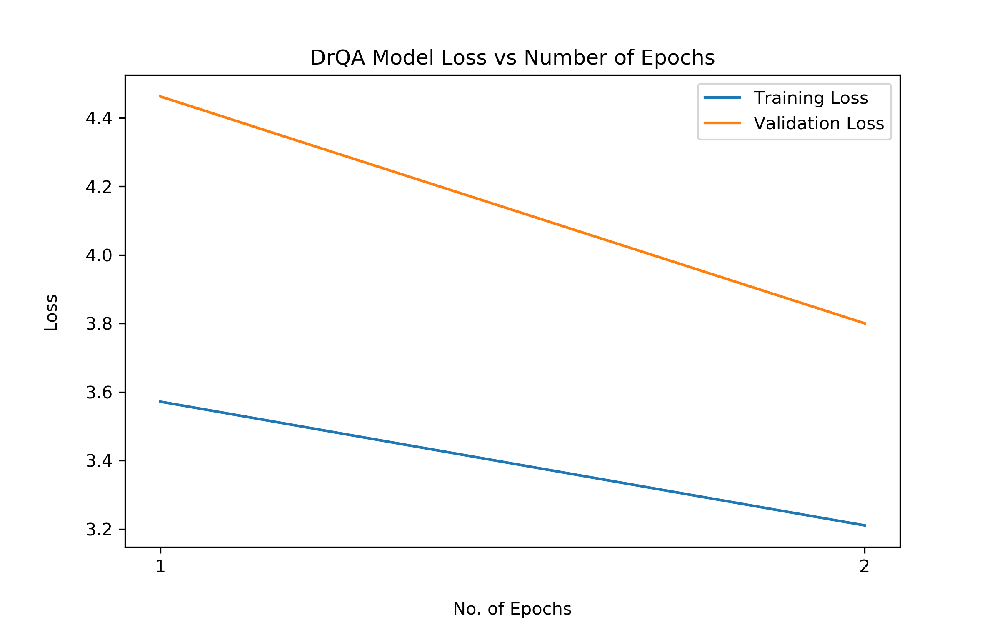

Even though 2 epochs may not be sufficient to definitely explain the model's trend in underfitting or overfitting data, as from the above loss vs number of epochs graph, the training and validation losses are in the same order of magnitude and we see that as training loss decreases, the validation loss also decreases, we can say that the model has not overfit the training data so far.

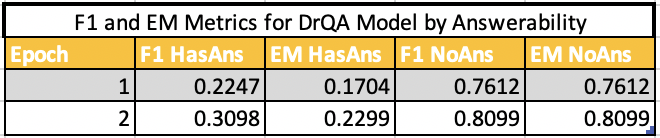

From the metric table above, we see that model seems to predict non-answerable questions with a higher f1 (0.8099) and EM (0.8099) score over answerable questions (f1 score = 0.3098 and EM score = 0.2299) in the last epoch. But as compared to the previous epoch's scores (f1 HasAns = 0.2247, EM hasAns =       0.1704, f1 NoAns = 0.7612, EM NoAns = 0.7612), the metric values are significantly higher with an increase of 0.0851 in f1 HasAns, an increase of 0.0595 in EM HasAns, an increase of 0.0487 in both f1 NoAns and EM NoAns. This means that initially the model still manages to extract answers and not predict everything as non-answerable, but does not extract enough of the answer span as the exact match score is still less than the f1 score. But the trends over the two epochs indicate that if the model was trained for more epochs, we would hope to see significant increase in the length of the answer span captured (leading to higher f1 HasAns and EM HasAns scores) as well as a smaller increase in the non-answerable questions identified.

Q3.2: When did the system work well? When did it fail?  Any ideas as to why? How might you improve the system?

**Answer**
From the table below, we can see that the system worked best at predicting no answers correctly when there was minimal overlap between the question words and the context tokens. In example 1, even though the phrase 'two types' exists in both the question and context, since the rest of the question does not appear anywhere in the context, especially the word 'portals', the model learns to predict no answer. The systems failed at predicting no answers correctly when there was a significant overlap between the question and context. In example 3, the words 'average', 'completion', 'time' and 'FWS' from the question all occur in the context quite close to each other, so the model learned to pick a time right after the phrase 'average time to completion' that is 'six years'. However it failed to pick up the fact that FWS is not a plan but an organization, forgetting the mention of the Endangered Species Recovery Plan at the beginning of the context. 

This system shows a tendency of predicting No Answer when the answer to a question is found at the end of the context paragraph as well as if the first few question words are not in the context paragraph. In examples 5 and 6 in the table below, the answers 'between their body and feet' and 'Georgia' are at the end of the context paragraphs, and the system predicts No Answer. In examples 10 and 11, even though the answer is at the beginning of the context paragraph, the first few (2-4) question words 'What is one piece' and 'By what means is' respectively are not present in the paragraph, and thus the system predicts No Answer.

However, in example 7, the question words 'British' and 'slavery' are present in the context and the answer is near the beginning of the context, so the system predicts '1834' as the answer correctly.

In sames cases, the answer spans predicted contain the corect answer but are too long. In example 12, the model does answer the question 'Where does snow fall in Egypt?', but reports a lot of extraneous information in the context as well. Thus in this example, the model got a low f1 score for not being specific enough at locating the target answer.

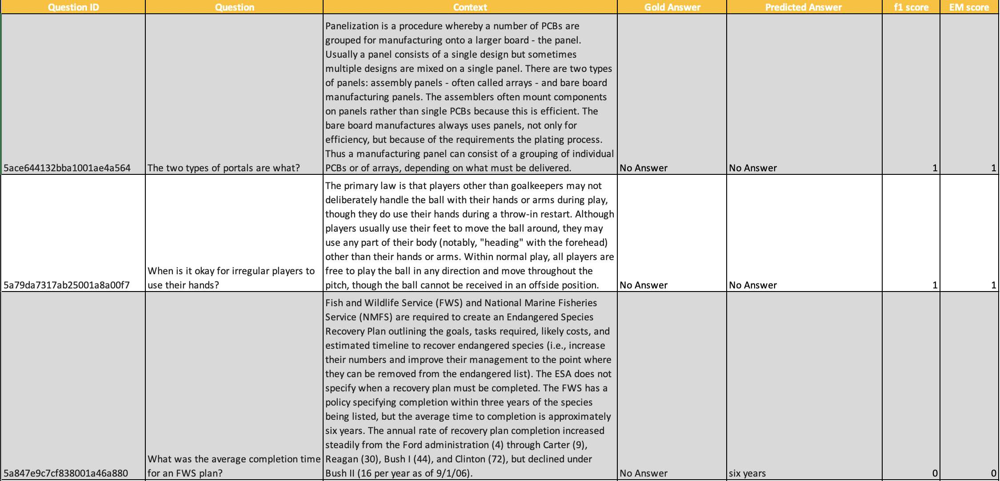

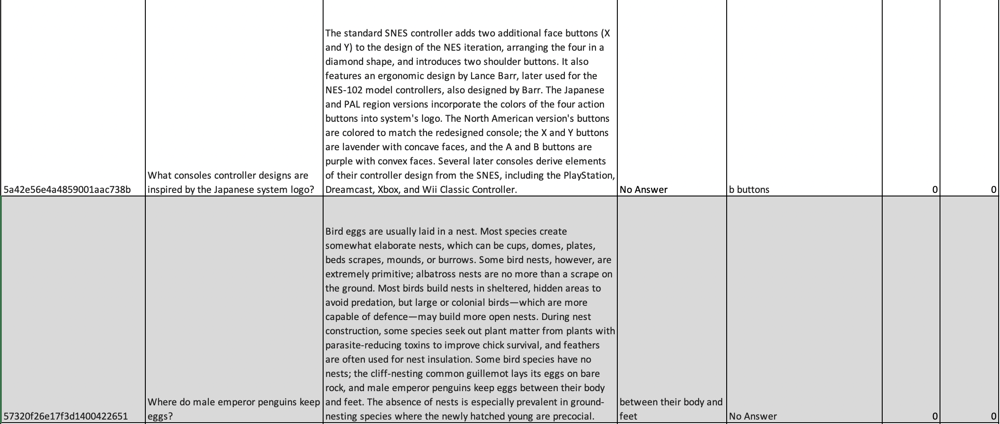

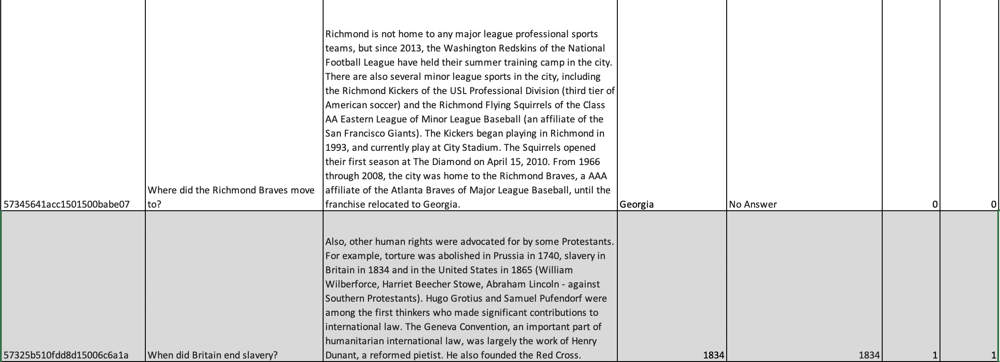

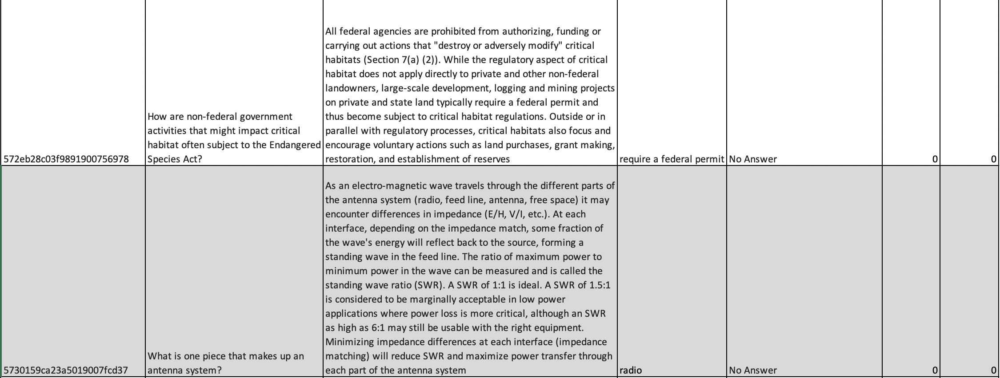

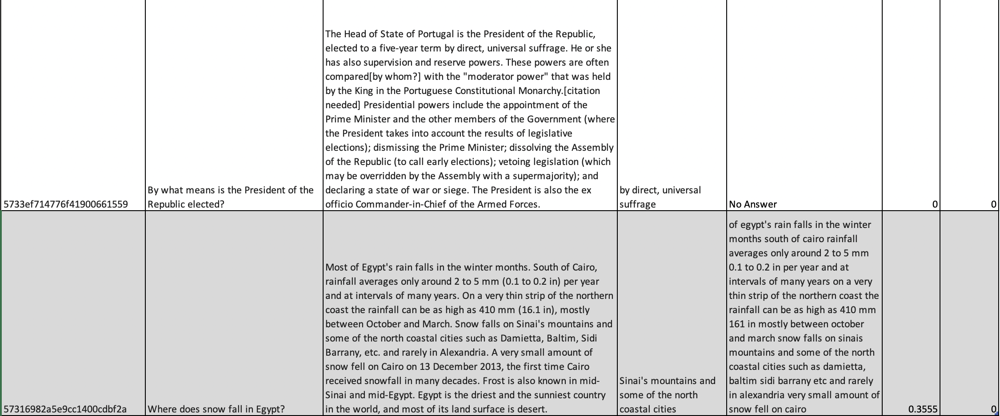

To improve the system, I would first try changing the way I created the training and validation splits. Instead of doing a 80-20 training validation split across all samples, where there is a possibility that the model while doing validation has seen a particular context during training, doing a split over the articles would be more representative of a real world NLP task, where the context is not known to the model. Thus such a model would be more robust when tested on new contexts and questions. 

Another way to improve the system would be to use a more sophisticated prediction rule. Currently, the start and end token indices with the maximum probability scores are chosen to select the answer span, and if the start token index is greater than the end token index, the question is predicted to be unanswerable. However, this scheme assumes that the start and end token indices are independent of each other. It may be possible to get better results considering the start and end tokens in conjuction. In the paper, the authors choose the best start and end indices i and j such that the product of probabilities
P<sub>start</sub>(i) * P<sub>end</sub>(j) is maximized, such that i <= j. For my purpose I would modify this slightly, choose the best start and end indices i and j such that the product of probabilities
P<sub>start</sub>(i) * P<sub>end</sub>(j) is maximized. If i > j, the start token is greater than the end token, predict the question to be unanswerable. This method could help accurately predict the length of the answer span considered, improving the f1 HasAns and EM HasAns scores.

In this implementation, I simply took the average of all question token representations from the question bi-LSTM assuming all question words are equally important. But due to the issues of the system somehow giving higher importance to question words in the beginning, creating a self-attention mechansim that has differing weights according to the importance of the word in answering a question, and using these weights to create a question representation *q* would be beneficial.

Increasing the number of training epochs as well as the number of layers in bi-LSTMs could help the model become more expressive as well.



Q3.3: What is the effect of the method used for handling unknown words? Note: Even if you choose to skip over unknown words, that is still a _method_ of handling out-of-vocabulary terms.

**Answer:**

There may be some words in our dataset that may not be present in the GloVe vocabulary. To handle this we use a vector unk (that is the average of all the vectors in the GloVe vocabulary), following the method suggested by the author of the GloVe paper [Jeffrey Pennington](https://stackoverflow.com/questions/49239941/what-is-unk-in-the-pretrained-glove-vector-files-e-g-glove-6b-50d-txt). There is a high probability that proper nouns like people and institution names might be out of vocabulary for the GloVe model. So replacing them all by the same vector, might increase similarity for the question and paragraph tokens than what is expected and cause some confusion for answer extraction. 

For example, if the question token list was ["where", "did", "aliva", "buy", "cookies"] and the context list was ["marlena", "bought", "cookies", "at", "wegmans", "and", "aliva", "bought", "cookies", "at", "target"], and "marlena" and "aliva" are out of context, they are both represented by the unk vector. Then the model could have a hard time figuring out the difference between "aliva" and "marlena" as there are 2 possible candidate spans for the answer with high similarity to the question tokens. Thus the model will need to be trained longer to learn these differences. 

# Part B: Fine-tune a Pre-trained Language Model

---

In this part, the goal is to build a strong system by fine-tuning a pre-trained language model. You can use **any** public code, **any** pre-trained language models, and **any** hardware resources -- anything other than code specifically written for SQUAD. A reasonable baseline F1 score to aim for is around 0.7.



In [ ]:
from transformers import DistilBertTokenizer, DistilBertModel
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

In [ ]:
def ans_tokens(para, ans):
    """
    This function returns the starting and ending indexes of the tokenized answer
    in the tokenized context mapped to integer ids in the vocabulary. 
    The context and answer must be tokenized using a 
    BertTokenizer. If the list of answer tokens is has length 2, i.e. 
    ans == [101,102] or the answer token list is not present (in order) in 
    the list of context tokens, this function 
    returns the start index as 1 and the end index as 0.
    :param para: List of context tokens
    :type para: List[int]
    :param ans: List of answer tokens
    :type ans: List[int]
    """
    start, end = 0, 0
    if len(ans) == 2:
      return 1, 0
    for i in range(len(para)):
      if (para[i: i+len(ans[1:-1])] == ans[1:-1]):
        start = i
        end = i + len(ans[1:-1]) - 1
        break
    if start == 0 and end == 0:
      return 1, 0
    return start, end

In [ ]:
squad_bert = []
for p in passages:
  context = p['context']
  for qas in p['qas']:
    question = qas['question']
    qid = qas['id']
    if qas['answers'] == []:
      answer = ''
    else:
      for a in qas['answers']:
        answer = a['text']
    squad_bert.append((context, qid, question, answer))

In [ ]:
train_bert = squad_bert[:104255]
val_bert = squad_bert[104255:]

# Simple approximate 80:20 training validation split

train_loader_bert, val_loader_bert = get_data_loaders_rnn(train_bert, val_bert, batch_size=12)

In [ ]:
def encoding(batch):
  """
    The function encoding returns a dictionary containing the 
    tokenized question and contexts using a BertTokenizer, token type ids and 
    attention mask for each sample represented in the batch. It also returns the 
    start and end token indexes for 
    the tokenized answer in the tokenized context, the question ids and the string
    answers for each sample in the batch.
    :param batch: The dataset, which consists of a list, containing 4 tuples.
    The first tuple contains the context strings,
    the second the questions ids, the third the question strings and the forth
    the answer strings for the samples in the batch.
    :type batch: List[n-Tuple[str], n-Tuple[str], n-Tuple[str], n-Tuple[str]]
    :rtype: Tuple[Dictionary, 
            torch.Tensor[List[int]], torch.Tensor[List[int]]],
            n-Tuple[str], n-Tuple[str]
    """
  conts, qids, ques, ans = batch
  inputs = tokenizer.batch_encode_plus(list(zip(ques, conts)), max_length = 512, padding = True, truncation=True, return_tensors='pt')
  start = []
  end = []
  for i in range(len(conts)):
    lst = list(np.array(inputs['input_ids'][i]))
    pos = ans_tokens(lst, tokenizer.encode(ans[i]))
    start.append(pos[0])
    end.append(pos[1])
  return inputs, torch.tensor(start), torch.tensor(end), qids, ans

In [ ]:
# model_path = os.path.join(os.getcwd(), "drive", "My Drive", "Colab Notebooks", "Project 4")

In [ ]:
class BERTQA(nn.Module):
  """
  This class represents the Bert Question Answering model.
  """

  def __init__(self):
    """
    This function initializes the Bert Question Answering model.
    """
    super(BERTQA, self).__init__()
    self.bert = DistilBertModel.from_pretrained('distilbert-base-uncased')
    self.S = nn.Linear(self.bert.config.hidden_size, 1)
    self.E = nn.Linear(self.bert.config.hidden_size, 1)
    self.softmax = nn.LogSoftmax(dim=1)
    self.loss = nn.NLLLoss()

  def compute_Loss(self, pred_start, gold_start, pred_end, gold_end):
    """
    This function computes the loss between the correct outputs and the predicted outputs
    using the model's loss function.
    param pred_start: The predicted starting token probabilities over sequence lengths
                      from the model for some samples. pred_start should be of size 
                      Batch Size * Sequence Length.
    type pred_start: torch.Tensor[List[List[Float]]]
    param gold_start: The correct outputs for the corresponding samples
                      The correct outputs should be of size Batch Size 
    type gold_start: torch.Tensor[List[int]]]
    param pred_end: The predicted ending token probabilities over sequence lengths
                      from the model for some samples. pred_end should be of size 
                      Batch Size * Sequence Length.
    type pred_end: torch.Tensor[List[List[Float]]]
    param gold_end: The correct outputs for the corresponding samples
                      The correct outputs should be of size Batch Size 
    type gold_end: torch.Tensor[List[int]]]
    """
    return self.loss(pred_start, gold_start) + self.loss(pred_end, gold_end)

  def forward(self, inputs):
    output = self.bert(**inputs, return_dict=True).to_tuple()
  
    w_s = self.S(output[0])
    start_ps = self.softmax(w_s).squeeze(2)

    w_e = self.E(output[0])
    end_ps = self.softmax(w_e).squeeze(2)
    
    return start_ps, end_ps

  def load_model(self, save_path):
    self.load_state_dict(torch.load(save_path))
    

  def save_model(self, save_path):
    torch.save(self.state_dict(), save_path)

In [ ]:
def train_epoch_bert(model, train_loader, optimizer):
  """
  This function trains the model for one epoch.
  param model: the model that we are training
  param train_loader: a data loader that contains training samples to train our model
  param optimizer: the optimizer used to train our model        
  """
  model.train()
  total = 0
  loss = 0

  for batch in tqdm(train_loader, leave=False, desc="Training Batches"):
    inputs, start, end, qids, ans = encoding(batch)
    output = model(inputs.to(get_device()))

    total += output[0].size()[0]

    _, start_pred = torch.max(output[0], 1)
    _, end_pred = torch.max(output[1], 1)

    loss = model.compute_Loss(output[0], start.to(get_device()), output[1], end.to(get_device()))
    
    optimizer.zero_grad()
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1)

    optimizer.step()
  print("train loss: " + str(loss))
    # Print accuracy
  return

f1_ans_db = {}
f1_noans_db = {}
em_ans_db = {}
em_noans_db = {}

def evaluation_bert(model, val_loader, optimizer):
  model.eval()
  loss = 0
  f1_ans_b = 0
  f1_noans_b = 0
  em_ans_b = 0
  em_noans_b = 0
  total = 0
  count_noans_b = 0

  for batch in tqdm(val_loader, leave=False, desc="Validation Batches"):
    inputs, start, end, qids, ans = encoding(batch)
    output = model(inputs.to(get_device()))

    total += output[0].size()[0]
    _, start_pred = torch.max(output[0], 1)
    _, end_pred = torch.max(output[1], 1)

    input_tokens = inputs['input_ids']
    for i in range(len(batch[0])):
      ans_gold = tokenizer.encode(ans[i])[1:-1]
      ans_pred = input_tokens[i][start_pred[i]:end_pred[i]+1]
      if ans[i] == '':
        val_f1 = compute_f1(ans_gold, ans_pred)
        val_em = compute_exact(ans_gold, ans_pred)
        f1_noans_b += val_f1
        em_noans_b += val_em
        f1_noans_db[qids[i]] = val_f1
        em_noans_db[qids[i]] = val_em
        count_noans_b += 1
      else:
        val_f1 = compute_f1(ans_gold, ans_pred)
        val_em = compute_exact(ans_gold, ans_pred)
        f1_ans_b += val_f1
        em_ans_b += val_em
        f1_ans_db[qids[i]] = val_f1
        em_ans_db[qids[i]] = val_em

    l = model.compute_Loss(output[0], start.to(get_device()), output[1], end.to(get_device()))
    loss += l.detach().item()
  loss /= len(val_loader)
  print("val loss: " + str(loss))
  print("val f1 HasAns: " + str(f1_ans_b/(total-count_noans_b)))
  print("val em HasAns: " + str(em_ans_b/(total-count_noans_b)))
  if count_noans_b == 0:
    print("No questions with no answers")
  else:
    print("val f1 NoAns: " + str(f1_noans_b/count_noans_b))
    print("val em NoAns: " + str(em_noans_b/count_noans_b))
  # Print validation metrics
  return

def train_and_evaluate_bert(number_of_epochs, model, train_loader, val_loader):
  optimizer = optim.Adam(model.parameters(), lr=5e-5)
  for epoch in trange(number_of_epochs, desc="Epochs"):
    train_epoch_bert(model, train_loader, optimizer)
    evaluation_bert(model, val_loader, optimizer)
  return optimizer

In [ ]:
# Lambda to switch to GPU if available
get_device = lambda : "cuda:0" if torch.cuda.is_available() else "cpu"

In [ ]:
torch.autograd.set_detect_anomaly(True)
model_bert = BERTQA().to(get_device())
opt_bert = train_and_evaluate_bert(2, model_bert, train_loader_bert, val_loader_bert)

In [ ]:
# model_bert.save_model(model_path+'/modelberts2'+str(epoch)+'.pt')
# torch.save(opt_bert.state_dict(), model_path+'/optberts2'+str(epoch)+'.pt')

### Q4: Implementation Details

Q4.1: Explain here how you implemented the fine-tuning (e.g. which algorithms/data structures you used, what features are included). Make clear which parts were implemented from scratch vs. obtained via an existing package. 


**Answer:**

**Preprocessing Data**

I preprocessed the SQuAD dataset so as to create a dataset stored as a list where every example/element had the string context, question id, string question, and string answer. I then created a Torch dataset that directly handles this data and created data loaders (using the function *get_data_loaders_rnn*). Further preprocessing (tokenizing, extracting start and end token indices, etc.) is done by the *encoding* function that processes a batch from the dataloader. This preprocessing is done on the fly during training instead of pre-training so as to reduce the amount of data stored in memory. 

In my implemented *encoding* function, I used a tokenizer from the *DistilBertTokenizer* module from the *transformers* library, pretrained with the model 'distilbert-base-uncased'. I used the *batch_encode_plus* function provided by the above tokenizer to generate a dictionary containing the tokenized question and contexts in terms of token ids as related to the model's vocabulary, list of token type ids (whether the token belongs to the question or context) and the attention mask for each sample represented in the batch. As the maximum token length allowed in the BERT model is 512, after combining the question and context tokens in the following format, [101, question tokens ids, 102, context tokens ids, 102], I allowed the *batch_encode_plus* function to truncate excess tokens. Here, 101 represents the [CLS] token and 102 represents the [SEP] token. In order to process data in batches and exploit parallelism in the model's forward and backward pass calculations, I also allowed the *batch_encode_plus* function to pad the above sequences to the maximum sequence length in the batch. Using my implemented *ans_tokens* function, I also generate the start and end token indices for the tokenized answer in the tokenized context.

**Model**

For implementing the BERTQA model, I used the original [BERT paper](https://arxiv.org/pdf/1810.04805.pdf) by Devlin et al. as inspiration. I used the DistilBertModel
'distilbert-base-uncased' as the base, rather than the BertModel 'bert-base-uncased', as the DistilBertModel was lighter and faster and worked without crashing at reasonable batch sizes, while using the BertModel exceeded Google Colab's memory limit. According to the [DistilBERT paper](https://arxiv.org/pdf/1910.01108.pdf) by Sanh et al., this model reduces the size of a BERT model by 40%, while retaining 97% of its language understanding capabilities and being 60% faster, so it was a good option to use in place of the 'bert-base-uncased' model. 

Using the sequence of last hidden states from the base DistilBert model, I apply
one linear transformation S using PyTorch's *nn.Linear* class, where S represents a start vector. This is equivalent to getting the dot product of each input token representation with the start vector S. Then I normalize these dot product values of the Context Length dimension using a softmax (*torch.nn.LogSoftMax*) and thus calculate the probability that a token in the context is a starting token for an answer. Similarly, I apply a linear transformation E, where E represents an end vector, apply a softmax on the resultant matrix along the Context Length dimension and calculate the probability that a token in the context is the ending token for an answer. The BERTQA model outputs a tuple with these start and end probabilities for all tokens in the context.

These values are then used as inputs for the *compute_Loss* function, where the model loss is calculated as the sum of the negative log likelihood losses for the predicted start token and the predicted end token as compared to the target start and end indices. I used PyTorch's *torch.nn.NLLLoss* function to calculate this, and then this loss is backpropogated through the model so it can update its weights as required.

The BERTQA model is trained and evaluated using the *train_and_evaluate_bert* function.

**Further Design Decisions**

I treated the question answering task as a span extraction task, but my method was different from the one in the BERT paper. In the preprocessing phase, in the function *ans_tokens*, if the answer token list was of length 2, i.e. ans=[101, 102] or the answer was not found within the context token list, the start and end token indices returned were 1 and 0 respectively. I chose these values as if I would try to slice a context token list using the expression context_tokens[start:end+1], context_tokens[1:0+1] would return an empty list in Python which is what is required for a non-answerable question. Thus if a model finds that it cannot answer a question, it should predict the start and end indices as 1 and 0 respectively. 

This decision also helps in determining the answerability of a question, where I use the condition that a question is not answerable if the start index with the maximum probability score is greater than the end index with the maximimum probability score. If the above condition is true, then I predict an empty string as the answer with answerability False. Otherwise, the answerability of the question is True, and I slice the context token list using the expression described above to retrieve the answer span and process them to form a string answer.

In the BERT paper, the model was trained on the SQuAD dataset for 2 epochs, with an Adam optimizer with learning rate 5e<sup>-5</sup> and batch size 48. Similarly, I trained my model using an Adam optimizer with learning rate  
  5e<sup>-5</sup> for 2 epochs, but had to reduce my batch size to 12 so as to successfully run the model within Google Colab's memory limits.

### Q5: Results Analysis

Q5.1: Explain here how you evaluated the model. Summarize the performance of your system and any variations that you experimented with the validation datasets. Put the results into clearly labeled tables or diagrams and include your observations and analysis. 

**Answer:**

I evaluated the model using the F1 and Exact Match metrics, separated by if the question has an answer (HasAns) and if the question does not an answer (NoAns), averaged over the answerable and non-answerable questions respectively.
I split the processed SQuAD dataset into a simple approximate 80-20 training validation split. In this particular split, it is possible that sone contexts in the training set could show up in the validation set, thus making the model decreasing the model's robustness with new contexts and questions. 

To counter this, I had planned to generate a new training and validation split by articles instead of samples, so that the model did not see the context during training time, but due to constraints in GPU time in Google Colab, I did not get to experiment with this. But, training a model on this split rather than my current train-validation split should definitely yield better f1 and EM scores on new data, as it does not rely on seen contexts as a crutch to predict answers. 

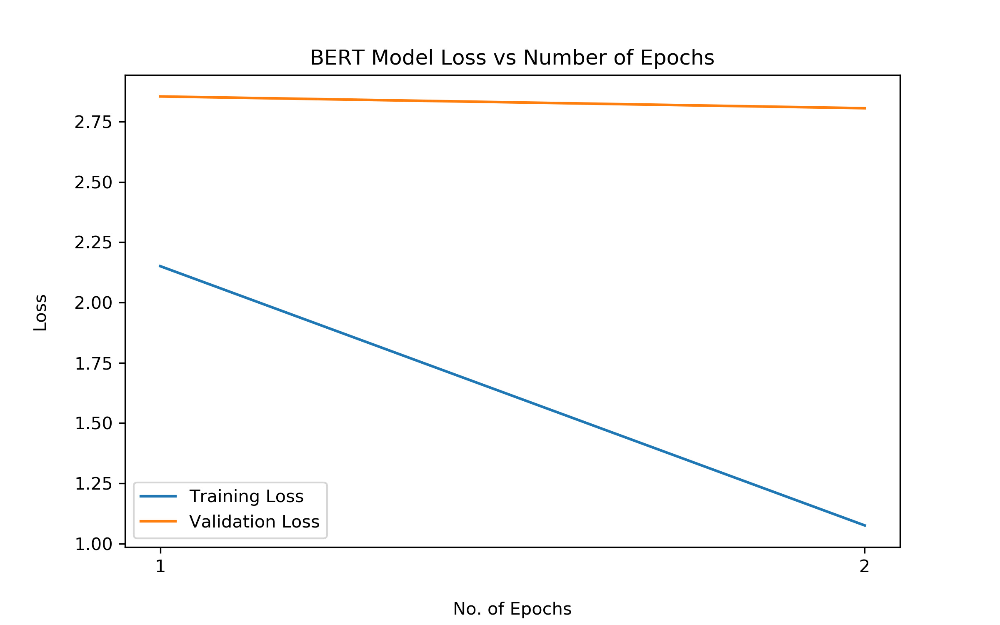

Even though 2 epochs may not be sufficient to definitely explain the model's trend in underfitting or overfitting data, as from the above loss vs number of epochs graph, the training and validation losses are in the same order of magnitude and we see that as training loss decreases, the validation loss also decreases (somewhat minutely), we can say that the model has not overfit the training data so far but also has not learnt too much since the last epoch.

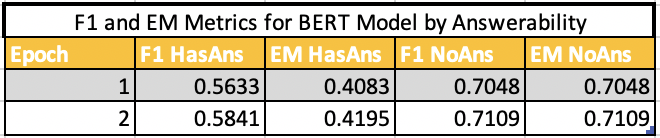

From the metric table above, we see that model seems to predict non-answerable questions with a higher f1 (0.7109) and EM (0.7109) score over answerable questions (f1 score = 0.5841 and EM score = 0.4195) in the last epoch. But as compared to the previous epoch's scores (f1 HasAns = 0.5633, EM hasAns =       0.4083, f1 NoAns = 0.7048, EM NoAns = 0.7048), the metric values are only slightly higher with an increase of 0.0208 in f1 HasAns, an increase of 0.0112 in EM HasAns, an increase of 0.0061 in both f1 NoAns and EM NoAns. This means that initially the model still manages to extract answers and not predict everything as non-answerable, but does not extract enough of the answer span as the exact match score is still less than the f1 score. As there is not much increase in the scores since the last epoch, we would need to train the model for more epochs to see if there will be significant increase and/or decrease in the scores reported or if this scores stagnate.


Q5.2: When did the system work well, when did it fail and any ideas as to why? How might you improve the system?

**Answer:**

From the table below, we can see that the system worked best at predicting no answers correctly when there was minimal overlap between the question words and the context tokens. In example 1, even though the phrase 'two types' exists in both the question and context, since the rest of the question does not appear anywhere in the context, especially the word 'portals', the model learns to predict no answer. The systems failed at predicting no answers correctly when there was a significant overlap between the question and context. In example 3, the words 'average', 'completion', 'time' and 'FWS' from the question all occur in the context quite close to each other, so the model learned to pick a time right after the phrase 'average time to completion' that is 'six years'. However it failed to pick up the fact that FWS is not a plan but an organization, forgetting the mention of the Endangered Species Recovery Plan at the beginning of the context. 

This trend is also seen in the answerable questions - if there is a high syntactic similarity between the question and context locally within a context, the model tends to predict an answer, and refrains otherwise. For example, in the 8th example, there are quite a few common phrases between the question and context such as 'non-federal' and 'critical habitat' but as they are scattered throughout the context, it is hard for the model to retrieve an answer. 

The model also tends to ignore specific words that limit the information needed in the question when the rest of the question has a high similarity with the context. In the 10th example, the question asked for only one piece that made up the antenna system, but the model reported all of them, probably because it recognized the phrase 'antenna system' but as 'one' did not exist in the context, the model did not understand that information had to be limited. It simple extracted all the related information.

But overall, the model seemed to do quite well as quite a few of the predicted answers had f1 scores > 0.8, that means they were missing one of two tokens from the beginning or the end. Some of these tokens may not be strictly necessary, as in example 11, where human judgement may rate 'direct, universal suffrage' to be as good an answer as 'by direct, universal suffrage'. Similarly, in example 12, the model does answer the question 'Where does snow fall in Egypt?' correctly as per human judgement, reporting the more significant name of the city and omitting the generic 'some of the north coastal cities'. Thus in this example, the model got a low f1 score for being too brief.

berterr1.png


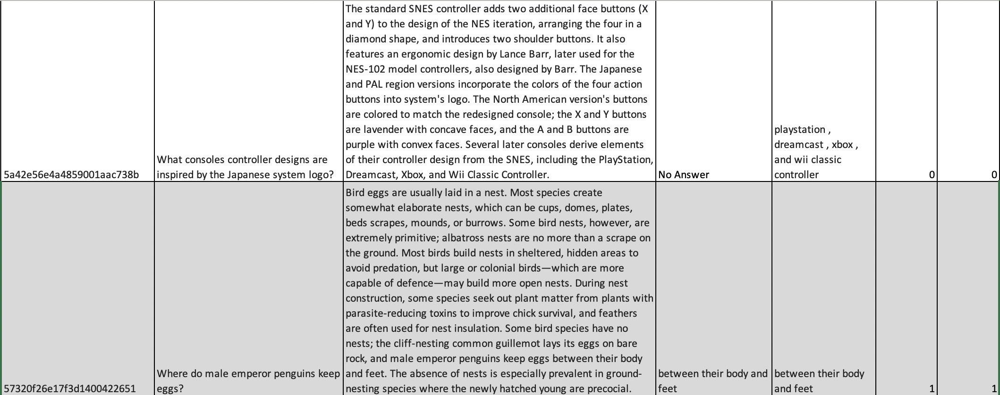

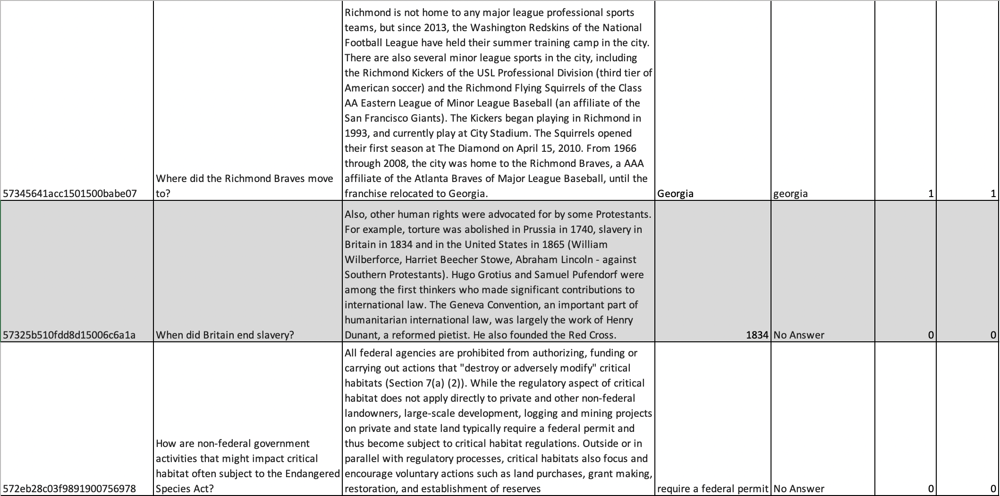

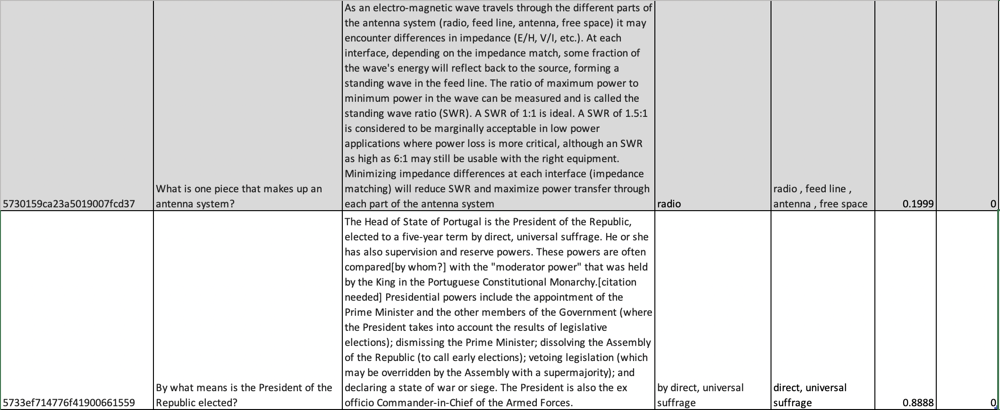

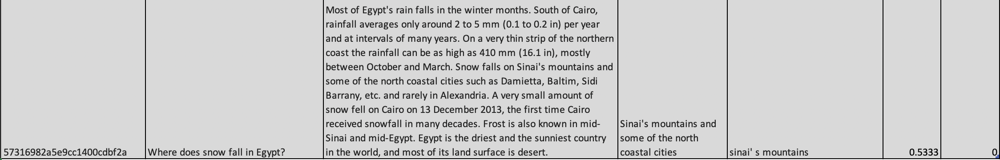

To improve the system, I would first try changing the way I created the training and validation splits. Instead of doing a 80-20 training validation split across all samples, where there is a possibility that the model while doing validation has seen a particular context during training, doing a split over the articles would be more representative of a real world NLP task, where the context is not known to the model. Thus such a model would be more robust when tested on new contexts and questions. 

Another way to improve the system would be to use a more sophisticated prediction rule. Currently, the start and end token indices with the maximum probability scores are chosen to select the answer span, and if the start token index is greater than the end token index, the question is predicted to be unanswerable. In the paper, the authors treat the span extraction task a bit differently. Questions that do not have an answer as having an answer span with start and end at the [CLS] token. This means that on slicing the context tokens, we would get the [CLS] token as an answer, i.e. the answer token list = [101], rather than an empty list. 

For prediction, the authors compared the score of the no-answer span, s<sub>null</sub> calculated by summing up the probabilities that the [CLS] token is the start and end token, to the score of the best non-null span for start token index i and end token index j s<sub>no-null</sub>, such that the sum of the probabilities P<sub>start</sub>(i) + P<sub>end</sub>(j) is maximized, such that i <= j. Then they tuned a threshold t on the validation set such that if s<sub>no-null</sub> > s<sub>null</sub> + t, the question is answerable, otherwise it is not. This method would help mitigate the fact that there are often very minute differences in the start and end probabilities of every token, and doing a simple argmax on the probability scores does not necessarily give the best answer.


#Comparing the two models

---


### Q6:


Compare here your results for the two models. How are you evaluating their performance? Which of them performs better using this metric and how much better? 

**Answer:**

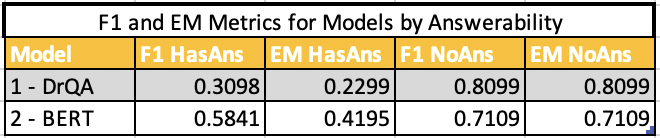

I evaluated the models using the F1 and Exact Match metrics, separated by if the question has an answer (HasAns) and if the question does not an answer (NoAns), averaged over the answerable and non-answerable questions respectively.

From the above metric table, we see that Model 1 - the DrQA model has a higher f1 and EM score for questions that cannot be answered as compared to Model 2 - the BERT model. The DrQA model's f1 and EM NoAns score is greater than the BERT model's score by 0.099 points. 

On the other hand, we see that Model 2 - the BERT model has a higher f1 and EM score for answerable questions as compared to Model 1 - the DrQA model. The BERT model's f1 HasAns score is greater than the DrQA model's f1 HasAns score by 0.2743 points. The BERT model's EM HasAns score is greater than the DrQA model's EM HasAns score by 0.1896 points.

The average f1 score for Model 1 is 0.5598, while the average f1 score for Model 2 is 0.6475. The average EM score for Model 1 is 0.5199 while the average EM score for Model 2 is 0.5652.

When we split the validation set by answerability, we see that Model 1 seems to be better at predicting if the questions have no answers, while Model 2 seems to be better at actually predicted answering spans with a high degree of similarity with the expected answer. However, Model 2 has the higher average f1 score than Model 1 by 0.0877 points, and the higher average EM score than Model 1 by 0.0453 points. Overall, looking at this averaged f1 and EM metric, Model 2 performs better than Model 1.




###Q7: Error Analysis
Do some error analysis. What are error patterns you observed one model making but not the other? Try to justify why/why not?

**Answer:**

In Model 1, the system tends to predict No Answer when the required answer is at the end of the context paragraph or the first few words in the question are not present in the context paragraph. In examples 5 and 6 in the error examples table for Model 1 in Q. 3.2, the answers 'between their body and feet' and 'Georgia' are at the end of the context paragraphs, and the system predicts No Answer. In examples 10 and 11 in the same table, even though the answer is at the beginning of the context paragraph, the first few (2-4) question words 'What is one piece' and 'By what means is' respectively are not present in the paragraph, and thus the system predicts No Answer.

However, in example 7, the question words 'British' and 'slavery' are present in the context and the answer is near the beginning of the context, so the system predicts '1834' as the answer correctly.

When the required answer is at the end of the context paragraph, it is possible that the system may have realized that the ends of most contexts are padded, and during training found that answers were near the beginning of the context. The system could have learnt that the end of the contexts are not useful for finding answers, ignores those context parts for potential candidate spans. For the question words issue, it is possible that the system began looking out for 'wh' words like when, where, what, etc. in the question as these words help the system predict the type of answer needed. Based on the style of questions framed, the system may have learnt to expect a keyword from the context right after the question type word or within 2-3 tokens of it. If this condition is not satisfied, the system could have a hard time predicting the answer span and think there is no answer in the context.

The above error trend does not occur in Model 2. In fact, Model 2 seems to overcome the issues in the examples described above and predicts the required answer.

For Model 2, the system predicts the answer correctly for an answerable question if there is a high degree of similarity, i.e. the question contains a phrase of at least 2 continuous words that overlaps with the context paragraph. The system appears to look for this keyphrase and predicts an answer span close to the occurence of the keyphrase in the context. But if the question does contain words in the context, but those words are scattered throughout the context and do not occur as is, the system has a tough time predicting the answer span. 

For example, consider example 7 in the error examples table in Q. 3.2 for Model 1 and Q. 5.2 for Model 2. Model 1 correctly predicts the answer as '1834' while Model 2 gives No Answer. We can see that even though 'Britain' and 'slavery' occur in the context, the phrase 'Britain end slavery' does not explicitly occur in the context in that order. Thus, Model 2 predicts No Answer in such situations.


# Gradescope Submission 
---




This time, we will actually be probing your model rather than you having to predict on the test set. We show an example in the appendix but you will need to upload a zip file that contains `solution.py`. This file will download your parameters via Google drive, load them into your model, and have a `predict` function that we will use.

The `predict` function takes in a `question` string and an `context` string identifies the words within the `context` that are the answer (if there is one) and also returns the answerability of the question. We give a sample within the appendix

### Q9: Competition Score
Include here your **team name** and the **screenshot** of your best score from Gradescope.

**Answer:** Team Name: ad677, Gradescope Leaderboard Screenshot below.

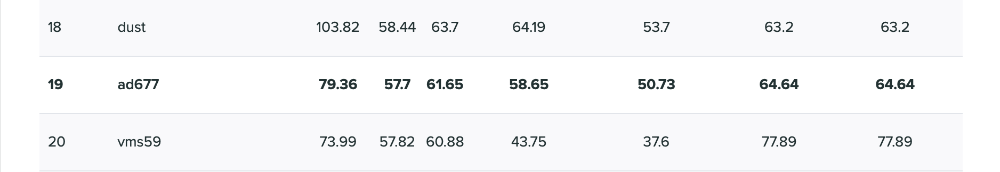

In [ ]:
import os
import pathlib
import warnings

warnings.filterwarnings("ignore", category=UserWarning)
import re

import requests
import subprocess
import torch
import transformers
import torch.nn as nn
from transformers import DistilBertTokenizer, DistilBertModel

directory = pathlib.Path(os.path.abspath('')).parent.absolute()

drive_path = "https://drive.google.com/file/d/128H9gYq3tWt4Nch0jub9NF2RL8wuTXT8/view?usp=sharing"

gdrive_id = re.search("https://drive.google.com/file/d/(.*)/view\?usp=sharing", drive_path).group(1)
# print(f"GDrive ID: {gdrive_id}")


def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params={"id": id}, stream=True)
    token = get_confirm_token(response)

    if token:
        params = {"id": id, "confirm": token}
        response = session.get(URL, params=params, stream=True)

    save_response_content(response, destination)


def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith("download_warning"):
            return value

    return None


def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk:  # filter out keep-alive new chunks
                f.write(chunk)


download_file_from_google_drive(gdrive_id, f"{str(directory / 'ad677_parameters.zip')}")
print("Parameters downloaded")
print(directory)

proc = subprocess.Popen(
    [f"unzip -o {str(directory / 'ad677_parameters.zip')} -d {str(directory)}"],
    stdout=subprocess.PIPE,
    shell=True,
)

(out, error) = proc.communicate()
pathlib.Path(f"{str(directory / 'ad677_parameters.zip')}").unlink()
#pathlib.Path(f"{str(directory / 'ad677_parameters')}").unlink()


class BERTQA(nn.Module):
    """
    This class represents the Bert Question Answering model.
    """

    def __init__(self):
        """
        This function initializes the Bert Question Answering model.
        """
        super(BERTQA, self).__init__()
        self.bert = DistilBertModel.from_pretrained("distilbert-base-uncased")
        self.S = nn.Linear(self.bert.config.hidden_size, 1)
        self.E = nn.Linear(self.bert.config.hidden_size, 1)
        self.softmax = nn.LogSoftmax(dim=1)
        self.loss = nn.NLLLoss()

    def compute_Loss(self, pred_start, gold_start, pred_end, gold_end):
        """
        This function computes the loss between the correct outputs and the predicted outputs
        using the model's loss function.
        param pred_start: The predicted starting token probabilities over sequence lengths
                          from the model for some samples. pred_start should be of size
                          Batch Size * Sequence Length.
        type pred_start: torch.Tensor[List[List[Float]]]
        param gold_start: The correct outputs for the corresponding samples
                          The correct outputs should be of size Batch Size
        type gold_start: torch.Tensor[List[int]]]
        param pred_end: The predicted ending token probabilities over sequence lengths
                          from the model for some samples. pred_end should be of size
                          Batch Size * Sequence Length.
        type pred_end: torch.Tensor[List[List[Float]]]
        param gold_end: The correct outputs for the corresponding samples
                          The correct outputs should be of size Batch Size
        type gold_end: torch.Tensor[List[int]]]
        """
        return self.loss(pred_start, gold_start) + self.loss(pred_end, gold_end)

    def forward(self, inputs):
        output = self.bert(**inputs, return_dict=True).to_tuple()

        w_s = self.S(output[0])
        start_ps = self.softmax(w_s).squeeze(2)

        w_e = self.E(output[0])
        end_ps = self.softmax(w_e).squeeze(2)

        return start_ps, end_ps

    def load_model(self, save_path):
        self.load_state_dict(torch.load(save_path, map_location=torch.device('cpu')))

    def save_model(self, save_path):
        torch.save(self.state_dict(), save_path)


get_device = lambda: "cuda:0" if torch.cuda.is_available() else "cpu"
model = BERTQA().to(get_device())
model.load_model(str(directory / "ad677_parameters" / "model.pt"))

tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

model.eval()
print("Model loaded")


def predict(question, context):
    """predict uses your PCE model and predicts the answer and answerability

    Takes a `question` string and an `context` string (which contains the
    answer), and identifies the words within the `context` that are the
    answer, and if there is an answer

    :param question: The question to answer
    :type question: str
    :param context: The context in which to search for the answer
    :type context: str
    :return: A pair of (answer, hasAns) that represents the model's prediction
        on the answer and whether this question is answerable
    :rtype: Tuple[str, bool]
    """
    with torch.no_grad():
        # ======== Tokenize ========
        # Apply the tokenizer to the input text, treating them as a text-pair.
        inputs = tokenizer.encode_plus(
            question, context, max_length=512, truncation=True, return_tensors="pt"
        )

        # ======== Evaluate ========
        # Run our example question through the model.
        start_scores, end_scores = model(inputs.to(get_device()))

        # ======== Reconstruct Answer ========
        # Find the tokens with the highest `start` and `end` scores.
        answer_start = int(torch.argmax(start_scores.cpu()))
        answer_end = int(torch.argmax(end_scores.cpu()))

        if answer_start > answer_end:
            return "", False

        # Get the string versions of the input tokens.
        tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])

        # Start with the first token.
        answer = tokens[answer_start]

        # Select the remaining answer tokens and join them with whitespace.
        for i in range(answer_start + 1, answer_end + 1):

            # If it's a subword token, then recombine it with the previous token.
            if tokens[i][0:2] == "##":
                answer += tokens[i][2:]

            # Otherwise, add a space then the token.
            else:
                answer += " " + tokens[i]

        # print('Answer: "' + answer + '"')

        return answer, True


#Appendix
---


## Approximate Projected Point Breakdown

- Q1. Dataset observations (5)
- Q1.1 Implement and discuss the metric(s) (5)
- Q2. Implement your own model (20)
- Q3. Evaluate your own model (10)
- Q4. Implement finetuning (25)
- Q5. Evaluate finetuned model (10)
- Q6. Compare the results (5)
- Q7. Failure analysis (5)
- Q8. Predictions submission (5)
- Code quality (5)
- Page assignment and clarity (5)







## Gradescope Details

Below is a sample `solution.py` code to submit on gradescope. This is also available on Piazza! As it stands, it will not run but this is because the QA model is currently not defined. This is something you will need to write.

```python
import os
import pathlib
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
import re

import requests
import torch
import transformers

directory = pathlib.Path(__file__).parent.absolute()

drive_path = "https://drive.google.com/file/d/1NbdW7rPuuCd6ij4bR_2yLL8zGvqfyVIb/view?usp=sharing"

gdrive_id = re.search("https://drive.google.com/file/d/(.*)/view\?usp=sharing", drive_path).group(1)
# print(f"GDrive ID: {gdrive_id}")

def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)


download_file_from_google_drive(gdrive_id, f"{str(directory / 'netid_parameters.zip')}")
print("Parameters downloaded")

proc = subprocess.Popen([f"unzip -o {str(directory / 'netid_parameters.zip')} -d {str(directory)}"], stdout = subprocess.PIPE, shell=True)

(out, error) = proc.communicate()
pathlib.Path(f"{str(directory / 'netid_parameters.zip')}").unlink()
pathlib.Path(f"{str(directory / 'netid_parameters')}").unlink()


get_device = lambda : "cuda:0" if torch.cuda.is_available() else "cpu"
model = BertQAModel.from_pretrained(str(directory / "netid_parameters" / "model")).to(get_device())
tokenizer = BertTokenizer.from_pretrained(str(directory / "netid_parameters" / "tokenizer"))

model.eval()
print("Model loaded")


def predict(question, context):
    '''predict uses your PCE model and predicts the answer and answerability

    Takes a `question` string and an `context` string (which contains the
    answer), and identifies the words within the `context` that are the
    answer, and if there is an answer

    :param question: The question to answer
    :type question: str
    :param context: The context in which to search for the answer
    :type context: str
    :return: A pair of (answer, hasAns) that represents the model's prediction
        on the answer and whether this question is answerable
    :rtype: Tuple[str, bool]
    '''
    with torch.no_grad():
        # ======== Tokenize ========
        # Apply the tokenizer to the input text, treating them as a text-pair.
        input_ids = tokenizer.encode(question, context, max_length=512, truncation=True,)

        # Report how long the input sequence is.
        # print('Query has {:,} tokens.\n'.format(len(input_ids)))

        # ======== Set Segment IDs ========
        # Search the input_ids for the first instance of the `[SEP]` token.
        sep_index = input_ids.index(tokenizer.sep_token_id)

        # The number of segment A tokens includes the [SEP] token istelf.
        num_seg_a = sep_index + 1

        # The remainder are segment B.
        num_seg_b = len(input_ids) - num_seg_a

        # Construct the list of 0s and 1s.
        segment_ids = [0]*num_seg_a + [1]*num_seg_b

        # There should be a segment_id for every input token.
        assert len(segment_ids) == len(input_ids)

        # ======== Evaluate ========
        # Run our example question through the model.
        start_scores, end_scores = model(torch.tensor([input_ids]).to(get_device()), # The tokens representing our input text.
                                        token_type_ids=torch.tensor([segment_ids]).to(get_device())) # The segment IDs to differentiate question from context

        # ======== Reconstruct Answer ========
        # Find the tokens with the highest `start` and `end` scores.
        answer_start = torch.argmax(start_scores.cpu())
        answer_end = torch.argmax(end_scores.cpu())

        # Get the string versions of the input tokens.
        tokens = tokenizer.convert_ids_to_tokens(input_ids)

        # Start with the first token.
        answer = tokens[answer_start]

        # Select the remaining answer tokens and join them with whitespace.
        for i in range(answer_start + 1, answer_end + 1):
            
            # If it's a subword token, then recombine it with the previous token.
            if tokens[i][0:2] == '##':
                answer += tokens[i][2:]
            
            # Otherwise, add a space then the token.
            else:
                answer += ' ' + tokens[i]

        # print('Answer: "' + answer + '"')

        return answer, True

```
